In [2]:
# import the necessary libraries
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [4]:
# defining the unet model architecture
def unet_model(input_shape=(256, 256, 3)):
    # encoder portion
    inputs = Input(shape=input_shape)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)

    # decoder portion
    up4 = concatenate([UpSampling2D(size=(2, 2))(conv3), conv2], axis=-1)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(up4)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)

    up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv1], axis=-1)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up5)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)

    output = Conv2D(3, (1, 1), activation='sigmoid')(conv5)  # Assuming RGB output

    model = Model(inputs=inputs, outputs=output)
    return model

model = unet_model()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_11 (Conv2D)          (None, 256, 256, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 conv2d_12 (Conv2D)          (None, 256, 256, 64)         36928     ['conv2d_11[0][0]']           
                                                                                                  
 max_pooling2d_2 (MaxPoolin  (None, 128, 128, 64)         0         ['conv2d_12[0][0]']           
 g2D)                                                                                       

In [15]:
# define load_normalize_image function to load and normalize input and target image
def load_normalize_image(input_path, target_path):
    input_img = img_to_array(load_img(input_path, target_size=(256, 256))) / 255.0
    target_img = img_to_array(load_img(target_path, target_size=(256, 256))) / 255.0
    return input_img, target_img

# specifying the location of the input images to the model and target images
# replace the location with the appropriate directories
input_path_org = 'C:/notebook_files/cartridge-segmentation/train-images/input'
target_path_org = 'C:/notebook_files/cartridge-segmentation/train-images/target'

image_files = os.listdir(input_path_org)

# specifying a generator to generate augmented images
# augmentation applied: 20 degree rotation, shift image horizontally 20%, shift images vertically by 20%
# random shearing, zoom into images by 20%, flip images horizontally and vertically
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',
    cval=255
)

augmented_input_images = []
augmented_target_images = []

# getting the input and target image one at a time, load the pair, perform image augmentation
# and append the images to their respective lists
# augmentation creates 7 extra images. For total 20 images there will be total 20*8 = 160 images
for image_file in image_files:
    if image_file.endswith('.png'):  # Assuming your images are in PNG format
        input_path = os.path.join(input_path_org, image_file)
        target_path = os.path.join(target_path_org, image_file.replace('input', 'target'))  # Assuming target images have similar names with 'target' instead of 'input'
        
        # Load and preprocess the original image pair
        input_img, target_img = load_normalize_image(input_path, target_path)

        # Append original images to the lists
        augmented_input_images.append(input_img)
        augmented_target_images.append(target_img)

        for i in range(7):  # 7 augmentations
            # apply image augmentation
            input_img_batch = np.expand_dims(input_img, axis=0)
            target_img_batch = np.expand_dims(target_img, axis=0)

            augmented_input_batch = data_gen.flow(input_img_batch, batch_size=1, seed=i).next()
            augmented_target_batch = data_gen.flow(target_img_batch, batch_size=1, seed=i).next()

            augmented_input_images.append(augmented_input_batch[0])
            augmented_target_images.append(augmented_target_batch[0])

# after adding the augmented images and the original image, performing shuffling
augmented_input_images = np.array(augmented_input_images)
augmented_target_images = np.array(augmented_target_images)

shuffle_indices = np.arange(len(augmented_input_images))
np.random.shuffle(shuffle_indices)

shuffled_input_images = augmented_input_images[shuffle_indices]
shuffled_target_images = augmented_target_images[shuffle_indices]

# creating an instance of the previously defined UNet model, compiling the model
# training the model and saving the model in h5 format after training
model = unet_model()

model.compile(optimizer=Adam(learning_rate=1e-4), loss=MeanSquaredError())

model.fit(shuffled_input_images, shuffled_target_images, epochs=1000, batch_size=1)

# specify the location where you want to store the trained model. we will use the trained model in the inference stage
model.save('C:/notebook_files/cartridge-segmentation/saved-model/unet_model.h5')

In [7]:
# function to display input images and target images from the training set without augmentation
def show_train_images(r):
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(augmented_input_images[r])
    ax[0].set_title("Training input image")
    ax[1].imshow(augmented_target_images[r])
    ax[1].set_title("Training segmented image")
    plt.show()

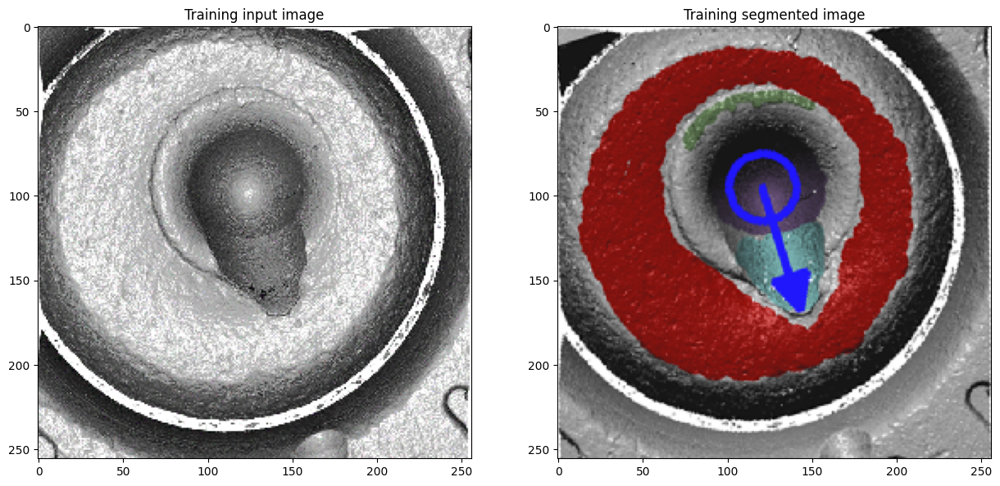

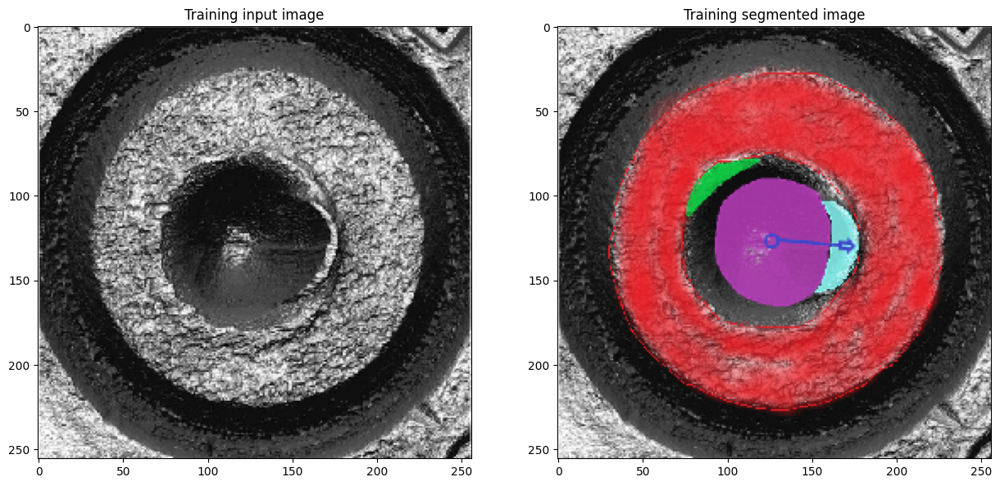

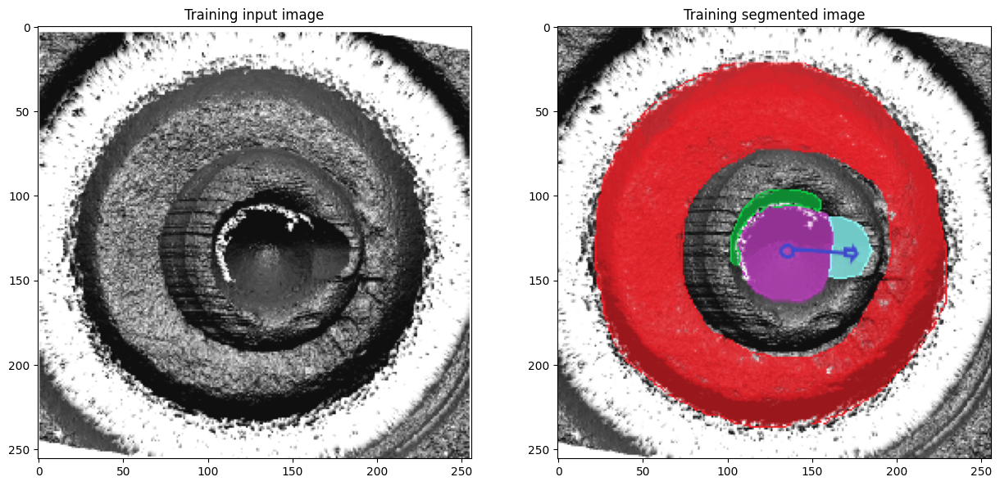

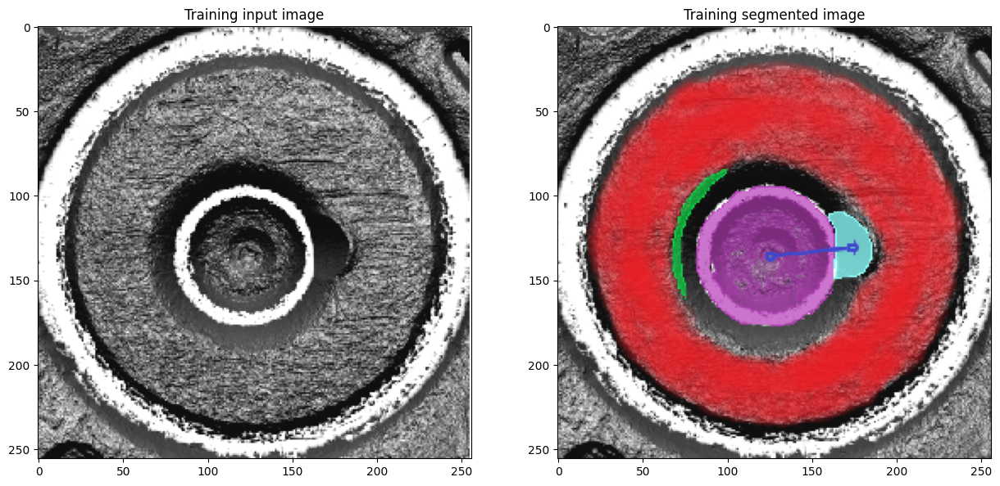

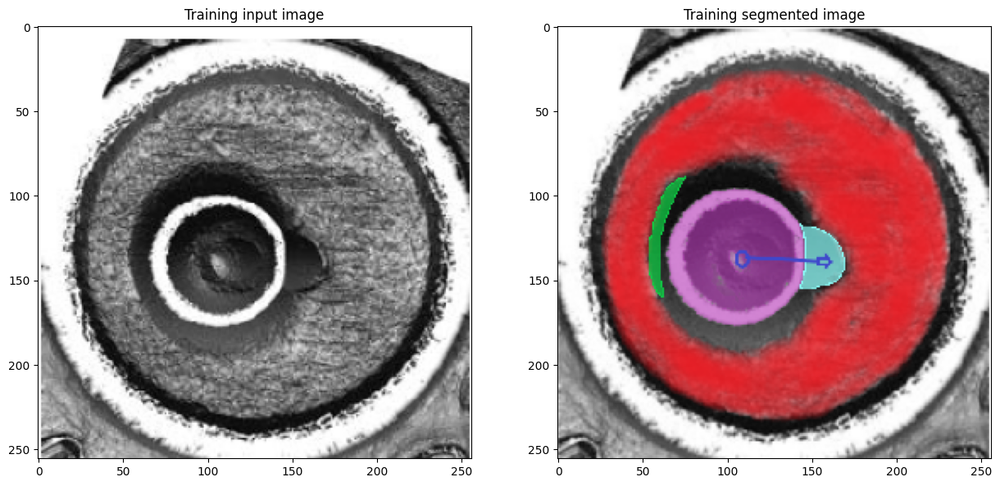

In [8]:
# displaying some input images and target images from the training set
show_train_images(0)
show_train_images(8)
show_train_images(16)
show_train_images(24)
show_train_images(32)

In [9]:
# displaying the various types of augmentations from the train set
def show_train_images_aug(train_set, x, flag):
    fig, ax = plt.subplots(1, 8, figsize=(25, 25))
    for i in range(8):
        ax[i].imshow(np.clip(train_set[x + i], 0.0, 1.0))
        ax[i].axis('off')
    if flag == 0:
        title = "Training image input"
    else:
        title = "Training image target"
    ax[0].set_title(title)
    ax[1].set_title("Rotation")
    ax[2].set_title("Horizontal shift")
    ax[3].set_title("Vertical shift")
    ax[4].set_title("Horizontal shift")
    ax[5].set_title("Image shearing")
    ax[6].set_title("Horizontal flip")
    ax[7].set_title("Vertical flip")
    plt.show()

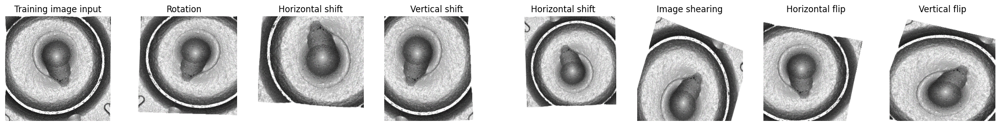

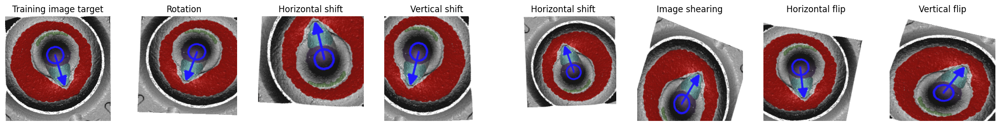

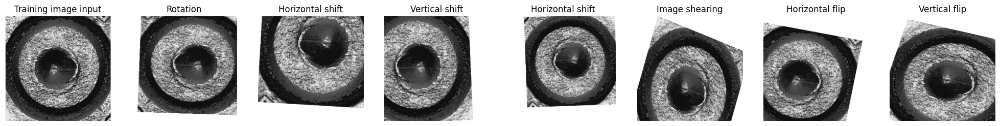

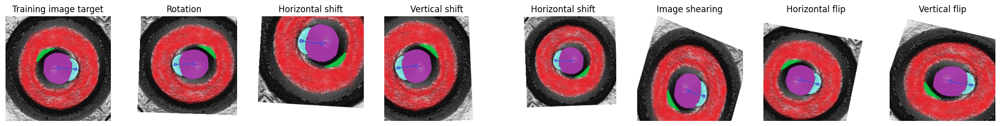

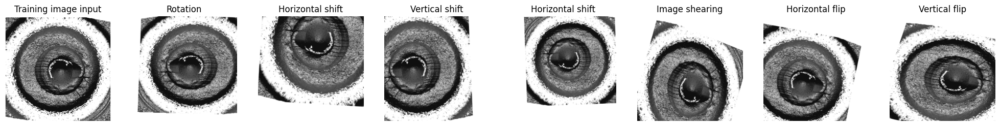

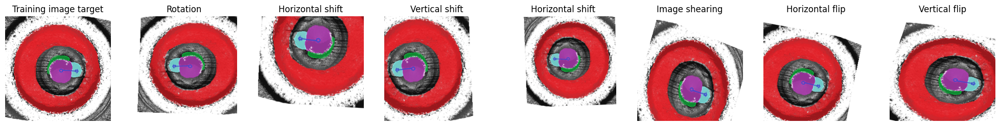

In [10]:
# some examples of training set after augmentation
show_train_images_aug(augmented_input_images, 0, 0)
show_train_images_aug(augmented_target_images, 0, 1)
show_train_images_aug(augmented_input_images, 8, 0)
show_train_images_aug(augmented_target_images, 8, 1)
show_train_images_aug(augmented_input_images, 16, 0)
show_train_images_aug(augmented_target_images, 16, 1)

In [11]:
# use the saved trained model for the inference stage
# generating 10 images from the model using the 10 test images
model = load_model('C:/notebook_files/cartridge-segmentation/saved-model/unet_model.h5')

# specify the location where the test images reside
test_path = 'C:/notebook_files/cartridge-segmentation/test-samples/test-images'

image_files = os.listdir(test_path)
test_images = []
generated_images = []

for image_file in image_files:
    input_path = os.path.join(test_path, image_file)
    test_image = img_to_array(load_img(input_path, target_size=(256, 256))) / 255.0
    test_images.append(test_image)
    test_image = np.expand_dims(test_image, axis=0)
    output_img1 = model.predict(test_image)
    generated_images.append(output_img1)

1/1 [==============================] - 0s 429ms/step


In [12]:
# post-processing operation to remove noise after image generation from the model
# we will first create a binary mask 
# then we will generate a new image by taking the portion outside of the mask from the input image 
# and the portion within the mask from the generated image

new_input_img = test_images
result_images = []
masks = []
for i in range(len(test_images)):
    
    output_img2 = generated_images[i] 
    # subtract the 2 image to get the difference region
    img3 = cv2.subtract(new_input_img[i]*255,output_img2[0]*255)

    # morphological close process to cluster nearby objects
    img_op = cv2.dilate(img3, None,iterations = 3)
    img_op = cv2.erode(img_op, None,iterations = 3)

    img_op = cv2.dilate(img_op, None,iterations = 3)
    img_op = cv2.erode(img_op, None,iterations = 3)

    img_op_clip = np.clip(img_op, 0.0, 1.0)
    img_op_clip = 1 - img_op_clip
    img_op_clip[img_op_clip > 0] = 1

    img_op_clip_bin = cv2.cvtColor(img_op_clip, cv2.COLOR_BGR2GRAY)
    img_op_clip_bin[img_op_clip_bin > 0] = 1

    aa = new_input_img[i].copy() 
    aa[:,:,0] = aa[:,:,0]*img_op_clip_bin
    aa[:,:,1] = aa[:,:,1]*img_op_clip_bin
    aa[:,:,2] = aa[:,:,2]*img_op_clip_bin

    # Perform morphological opening and closing to remove noise from the generated mask
    kernel = np.ones((15,15), np.uint8)
    closing_result = cv2.morphologyEx(aa, cv2.MORPH_OPEN, kernel)
    kernel = np.ones((30,30), np.uint8)
    closing_result = cv2.morphologyEx(closing_result, cv2.MORPH_CLOSE, kernel)
    masks.append(closing_result)
    # create a binary mask and use it to remove noise from the generated images
    closing_result[closing_result > 0] = 1
    result_image = new_input_img[i].copy()
    result_image[closing_result == 1] = output_img2[0][closing_result == 1]
    result_image[closing_result == 0] = new_input_img[i][closing_result == 0]
    result_images.append(result_image)

In [13]:
# function to display the inputimage, model generated image, mask and post-processed image
def display_images(i):
    fig,ax = plt.subplots(1,4,figsize=(15,15))
    ax[0].imshow(new_input_img[i]) 
    ax[0].set_title("Input image")
    ax[1].imshow(generated_images[i][0])
    ax[1].set_title("Generated image from model")
    ax[2].imshow(masks[i])
    ax[2].set_title("Generated mask")
    ax[3].imshow(result_images[i])
    ax[3].set_title("After post-processing generated image")

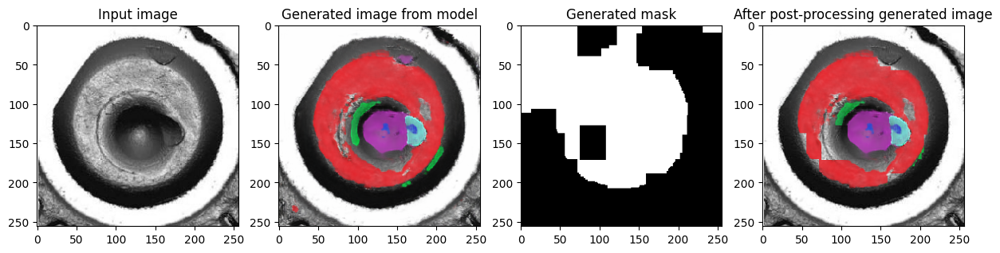

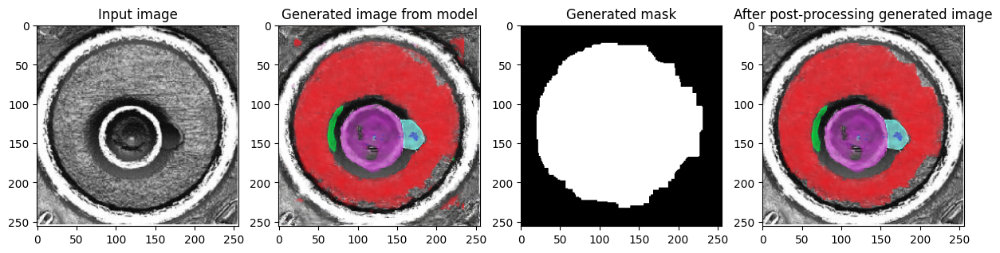

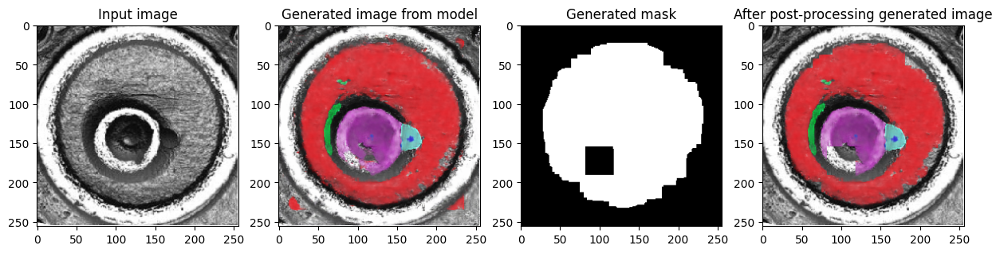

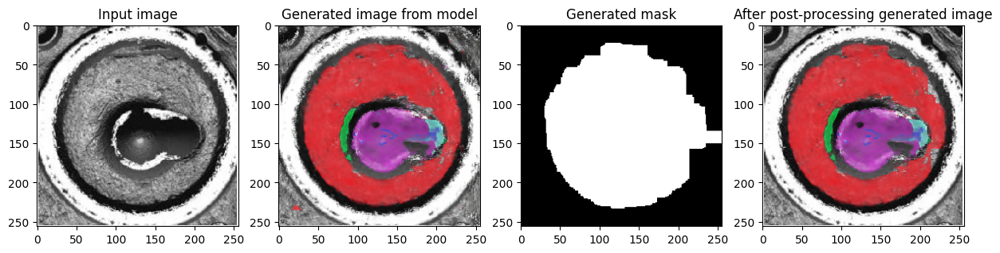

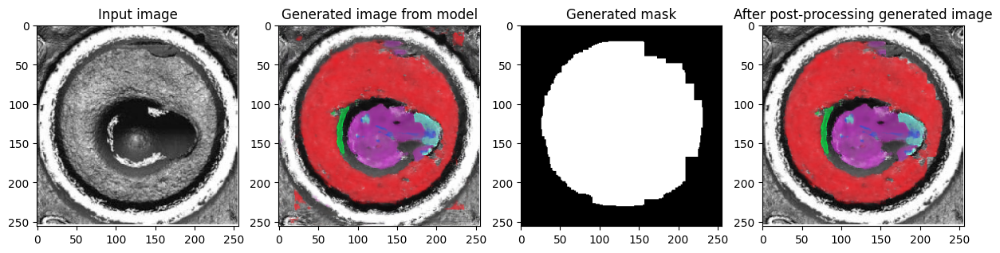

In [14]:
# some examples of test images, model generated images, corresponding masks and images after applying the masks
display_images(1)
display_images(2)
display_images(3)
display_images(8)
display_images(9)

In [ ]:
# saving the segmented images
for i in range(len(result_images)):
    # spcify the location to save the segmented images from the test set
    filename = f'C:/notebook_files/cartridge-segmentation/test-samples/test-result/test{i+1}_result.png'
    plt.imsave(filename, result_images[i])